In [1]:
import os
from datetime import datetime
import numpy as np
import glob
from satpy import Scene
import satpy
import subprocess

import pyresample
from pyresample import geo_filter, geometry, load_area
import shapely.geometry as sgeom

import cartopy.crs as ccrs
import pandas as pd

import PIL

import matplotlib.pyplot as plt

In [2]:
SAT_IMAGERY_PATH = '/storage/data/eumetsat/native/sorted'
TEMP_PATH = '/home/jack/temp'

In [3]:
def get_directory_for_datetime(sat_imagery_path: str, dt: datetime) -> str:
    """
    Args:
        sat_imagery_path:
        dt: the datetime for the requested image.  Will return
            the directory which is within 5 minutes of the requested image.
    Returns:
        Directory string
        
    Raises:
        FileNotFoundError
    """
    hour_path = dt.strftime("%Y/%m/%d/%H")
    hour_path = os.path.join(SAT_IMAGERY_PATH, hour_path)
    
    # Get a list of subdirectories containing minutes
    _, minute_dirs, _ = next(os.walk(hour_path))
    minutes_with_images = np.array(minute_dirs, dtype=int)
    
    # Quantize dt.minute to 5-minute intervals
    minute_lower_bound = (dt.minute // 5) * 5
    minute_upper_bound = minute_lower_bound + 5
    
    # Find matching directory for the minutes
    selection_condition = (
        (minute_lower_bound <= minutes_with_images) & 
        (minutes_with_images < minute_upper_bound))
    idx = np.flatnonzero(selection_condition)
    
    # Sanity check
    if idx.size == 0:
        raise FileNotFoundError(2, 'No minute directory for datetime {} under "{}"'.format(dt, hour_path))
    elif idx.size > 1:
        raise RuntimeError(
            'Found > 1 directories with images for datetime {}.'
            '  Base dir = "{}".  Subdirs found = {}'
            .format(dt, hour_path, minute_dirs))
        
    selected_minute_dir = minutes_with_images[idx[0]]
    selected_minute_dir = '{:02d}'.format(selected_minute_dir)
    selected_minute_dir = os.path.join(hour_path, selected_minute_dir)
    
    return selected_minute_dir

In [4]:
def get_image_filename_for_datetime(
    sat_imagery_path: str, 
    dt: datetime,
    pattern: str = 'MSG*.nat.bz2'
    ) -> str:
    
    image_path = get_directory_for_datetime(sat_imagery_path, dt)
    files = glob.glob(os.path.join(image_path, pattern))
    error_str = 'file matching "{}" in "{}" for datetime {}.'.format(pattern, image_path, dt)
    if len(files) == 0:
        raise FileNotFoundError(2, 'No ' + error_str)
    if len(files) > 1:
        raise RuntimeError('Found > 1 ' + error_str + '  Expected only one match.')
    image_filename = files[0]
    return image_filename

In [5]:
def decompress(full_bzip_filename: str) -> str:
    base_bzip_filename = os.path.basename(full_bzip_filename)
    base_nat_filename = os.path.splitext(base_bzip_filename)[0]
    full_nat_filename = os.path.join(TEMP_PATH, base_nat_filename)
    if not os.path.exists(full_nat_filename):
        with open(full_nat_filename, 'wb') as nat_file_handler:
            process = subprocess.run(
                ['pbzip2', '--decompress', '--keep', '--stdout', full_bzip_filename],
                stdout=nat_file_handler)
        process.check_returncode()
    return full_nat_filename

In [6]:
def get_seviri_hrv_area_definition(east_column_planned=2733) -> geometry.AreaDefinition:
    X_OFFSET = 32500 + ((2733 - east_column_planned) * 1000)
    HRV_WIDTH_PIXELS = 5568
    HRV_HEIGHT_PIXELS = 4176
    PROJECTION = {
        'proj': 'geos',
        'lon_0': 9.5,
        'a': 6378169.0,
        'b': 6356583.8,
        # The EUMETSAT docs say "The distance between spacecraft and centre of earth is 42,164 km. The idealized earth
        # is a perfect ellipsoid with an equator radius of 6378.1690 km and a polar radius of 6356.5838 km." 
        # The projection used by SatPy expresses height as height above the Earth's surface (not distance
        # to the centre of the Earth).
        'h': 35785831.00,
        'units': 'm'}

    seviri = geometry.AreaDefinition(
        area_id='seviri',
        description='SEVIRI RSS HRV',
        proj_id='seviri',   
        projection=PROJECTION,
        width=HRV_WIDTH_PIXELS,
        height=HRV_HEIGHT_PIXELS,
        area_extent=[  # VIS006 extent: -5570248.4773, 1393687.2705, 5567248.0742, 5570248.4773
            -2768872.0236 + X_OFFSET, # left
             1394687.3495, # bottom  (from scene['HRV'].area)
             2799876.1893 + X_OFFSET, # right
             5570248.4773] #5569248.1217] # top  (from scene['HRV'].area)
    )

    return seviri

In [7]:
def get_scene(sat_imagery_path: str, dt: datetime) -> Scene:
    full_bzip_filename = get_image_filename_for_datetime(sat_imagery_path, dt)
    full_nat_filename = decompress(full_bzip_filename)
    scene = Scene(
        filenames=[full_nat_filename],
        reader='seviri_l1b_native')
    
    # HRV images are offset differently on different images, so we need to grab
    # the relevant metadata
    handler = satpy.readers.seviri_l1b_native.NativeMSGFileHandler(full_nat_filename, {}, None)
    planned_coverage_hrv = handler.header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']
    scene.attrs['HRVLowerEastColumnPlanned'] = planned_coverage_hrv['LowerEastColumnPlanned']
    
    return scene

In [9]:
dt = datetime(year=2019, month=1, day=17, hour=12, minute=0)  # 2019-01-17 10:00 is fairly good for UK
scene = get_scene(SAT_IMAGERY_PATH, dt)
scene.load(['VIS006', 'HRV'])
hrv = scene['HRV']

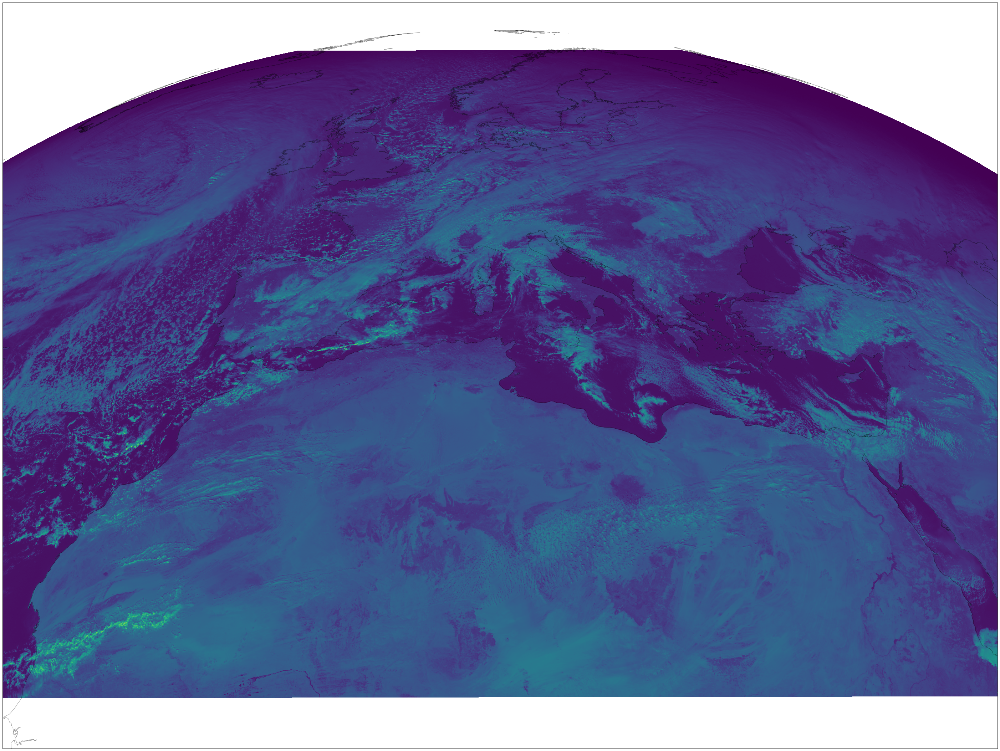

In [12]:
hrv = scene['HRV'].values
seviri = get_seviri_hrv_area_definition(scene.attrs['HRVLowerEastColumnPlanned'])
crs = seviri.to_cartopy_crs()
fig = plt.figure(figsize=(50, 40))
ax = plt.axes(projection=crs)
ax.coastlines(resolution='10m', alpha=0.4)
ax.imshow(
    hrv,
    extent=crs.bounds,
    origin='upper')

In [21]:
KM_TO_M = 1000

NORTH = 1223 * KM_TO_M
SOUTH = -185 * KM_TO_M
WEST = -239 * KM_TO_M
EAST = 857 * KM_TO_M

class UKVDomain(ccrs.OSGB):
    """The geographical domain of the UK Met Office UKV model."""
    
    @property
    def x_limits(self):
        return (WEST, EAST)
    
    @property
    def y_limits(self):
        return (SOUTH, NORTH)
    
    @property
    def boundary(self):
        return sgeom.LineString([
            (WEST, SOUTH), 
            (WEST, NORTH), 
            (EAST, NORTH), 
            (EAST, SOUTH), 
            (WEST, SOUTH)])
    
ukv = UKVDomain()
ukv

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/cartopy/mpl/ticker.py:476: MatplotlibDeprecationWarning: MaxNLocator.set_params got an unexpected parameter: dms
  MaxNLocator.set_params(self, **kwargs)


In [23]:
RESOLUTION_METERS_PER_PIXEL = 1000 # 
WIDTH = int((EAST - WEST) / RESOLUTION_METERS_PER_PIXEL)
HEIGHT = int((NORTH - SOUTH) / RESOLUTION_METERS_PER_PIXEL)
HEIGHT, WIDTH

(1408, 1096)

In [37]:
import rasterio
from rasterio import Affine as A
from rasterio.warp import reproject, Resampling, calculate_default_transform
from rasterio.control import GroundControlPoint

In [28]:
src_array = hrv

In [29]:
seviri.to_cartopy_crs().proj4_params

{'ellps': 'WGS84',
 'a': 6378169.0,
 'b': 6356583.8,
 'h': 35785831.0,
 'lon_0': 9.5,
 'no_defs': True,
 'proj': 'geos',
 'type': 'crs',
 'units': 'm',
 'x_0': 0.0,
 'y_0': 0.0}

In [20]:
hrv.shape

(4176, 5568)

In [27]:
dst_crs = ukv.proj4_params
dst_crs

{'datum': 'OSGB36',
 'ellps': 'airy',
 'proj': 'tmerc',
 'lon_0': -2,
 'lat_0': 49,
 'k': 0.9996012717,
 'x_0': 400000,
 'y_0': -100000,
 'units': 'm'}

In [34]:
src_height, src_width = src_array.shape

X_OFFSET = 32500
src_extent = {
    'left': -2768872.0236 + X_OFFSET,
    'bottom': 1394687.3495, # from scene['HRV'].area
    'right': 2799876.1893 + X_OFFSET,
    'top': 5570248.4773}

top_left = GroundControlPoint(row=0, col=0, x=src_extent['left'], y=src_extent['top'], id='top_left')
bottom_left = GroundControlPoint(row=src_height, col=0, x=src_extent['left'], y=src_extent['bottom'], id='bottom_left')
bottom_right = GroundControlPoint(row=src_height, col=src_width, x=src_extent['right'], y=src_extent['bottom'], id='bottom_right')
top_right = GroundControlPoint(row=0, col=src_width, x=src_extent['right'], y=src_extent['top'], id='top_right')

ground_control_points = [top_left, bottom_left, bottom_right, top_right]

In [35]:
ground_control_points

[GroundControlPoint(row=0, col=0, x=-2736372.0236, y=5570248.4773, id='top_left'),
 GroundControlPoint(row=4176, col=0, x=-2736372.0236, y=1394687.3495, id='bottom_left'),
 GroundControlPoint(row=4176, col=5568, x=2832376.1893, y=1394687.3495, id='bottom_right'),
 GroundControlPoint(row=0, col=5568, x=2832376.1893, y=5570248.4773, id='top_right')]

In [38]:
src_crs = seviri.to_cartopy_crs().proj4_params
dst_crs = ukv.proj4_params

In [86]:
transform, dst_width, dst_height = calculate_default_transform(
    src_crs=src_crs,
    dst_crs=dst_crs,
    width=src_width,
    height=src_height,
    gcps=ground_control_points,
    resolution=4000 # meters per pixel
    #dst_height=HEIGHT,
    #dst_width=WIDTH
)

transform

Affine(4000.0, 0.0, -2622708.2915565693,
       0.0, -4000.0, 4102859.743392177)

In [87]:
dst_shape = (dst_height, dst_width)
dst_shape

(2053, 1908)

In [88]:
dst_array = np.zeros(dst_shape, dtype=np.float32)

In [95]:
%%time
reproject(
    src_array,
    dst_array,
    src_crs=src_crs,
    dst_crs=dst_crs,
    gcps=ground_control_points,
    dst_transform=transform,
    num_threads=4,
    resampling=Resampling.cubic
)

CPU times: user 3 s, sys: 142 ms, total: 3.15 s
Wall time: 1.18 s


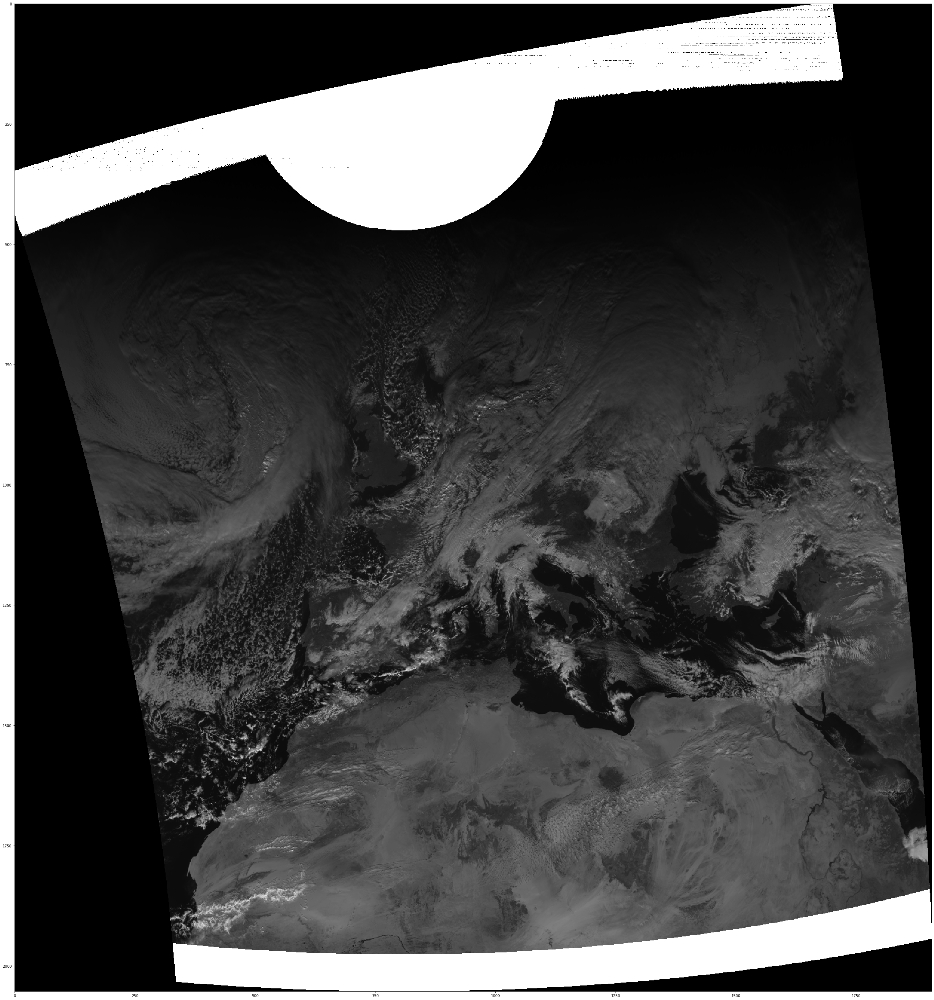

In [96]:
fig, ax = plt.subplots(figsize=(50, 50))
ax.imshow(dst_array, origin='upper', cmap='gray')